# Software testing - Merging

<div class="alert alert-warning">

**What the fourth section (Merging) does**
    
This section merges the different datasets and visualizes the merged data. The section contains the following important subsections:

* Merging <br>
* Alignment parameter visualization <br>
</div>  


### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#siletti
siletti_standard_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/data/siletti_standard_f1_reg_processed_1.h5ad'
siletti_standard_CR_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/data/siletti_standard_CR_f1_reg_processed_1.h5ad'

#altena
altena_standard_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_software_version_testing_starsolo/data/altena_standard_f1_reg_processed_1.h5ad'
altena_standard_CR_reg_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_software_version_testing_starsolo/data/altena_standard_CR_f1_reg_processed_1.h5ad'

no reg

In [4]:
#siletti
siletti_standard_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/data/siletti_standard_f1_processed_1.h5ad'
siletti_standard_CR_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/data/siletti_standard_CR_f1_processed_1.h5ad'

#altena
altena_standard_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/data/altena_standard_f1_processed_1.h5ad'
altena_standard_CR_processed='/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/data/altena_standard_CR_f1_processed_1.h5ad'

In [6]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_testing/0_software_version_testing_starsolo/')

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/notebooks/0_tests/software_version_test_starsolo'

In [6]:
!ls data/

altena_standard_CR_f1_processed_1.h5ad
altena_standard_CR_f1_reg_processed_1.h5ad
altena_standard_CR_filtered_1.h5ad
altena_standard_CR_preprocessed.h5ad
altena_standard_f1_processed_1.h5ad
altena_standard_f1_reg_processed_1.h5ad
altena_standard_filtered_1.h5ad
altena_standard_preprocessed.h5ad
siletti_standard_CR_f1_processed_1.h5ad
siletti_standard_CR_f1_reg_processed_1.h5ad
siletti_standard_CR_filtered_1.h5ad
siletti_standard_CR_preprocessed.h5ad
siletti_standard_f1_processed_1.h5ad
siletti_standard_f1_reg_processed_1.h5ad
siletti_standard_filtered_1.h5ad
siletti_standard_preprocessed.h5ad


In [8]:
files = [siletti_standard_reg_processed,siletti_standard_CR_reg_processed, altena_standard_reg_processed,  altena_standard_CR_reg_processed]

In [7]:
files_no_reg = [siletti_standard_processed,siletti_standard_CR_processed, altena_standard_processed,  altena_standard_CR_processed]

In [9]:
names = [name.split('_reg_processed')[0].split('/data/')[1] for name in files ]
print(names)

['siletti_standard_f1', 'siletti_standard_CR_f1', 'altena_standard_f1', 'altena_standard_CR_f1']


In [8]:
names_no_reg = [name.split('_processed')[0].split('/data/')[1] for name in files_no_reg ]
print(names_no_reg)

['siletti_standard_f1', 'siletti_standard_CR_f1', 'altena_standard_f1', 'altena_standard_CR_f1']


In [10]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_reg_"+"processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_siletti_standard_f1_reg_processed  is loaded
adata_siletti_standard_CR_f1_reg_processed  is loaded
adata_altena_standard_f1_reg_processed  is loaded
adata_altena_standard_CR_f1_reg_processed  is loaded


In [9]:
object_names_processed_no_reg=list()
numberobj = len(files_no_reg)

for i in range(numberobj):
    object_names_processed_no_reg.append("adata"+"_"+names_no_reg[i]+"_processed")
    locals()[object_names_processed_no_reg[i]] = sc.read(files_no_reg[i]) 
    print(object_names_processed_no_reg[i],' is loaded')

adata_siletti_standard_f1_processed  is loaded
adata_siletti_standard_CR_f1_processed  is loaded
adata_altena_standard_f1_processed  is loaded
adata_altena_standard_CR_f1_processed  is loaded


In [10]:
locals()[object_names_processed[3]].obs['atlas']

NameError: name 'object_names_processed' is not defined

Adding software annotation

In [10]:
#To make reproducible plots
np.random.seed(41)

In [11]:
starsolo=ad.concat([ adata_siletti_standard_f1_processed, adata_altena_standard_f1_processed],  join="outer", fill_value=0)
starsolo.obs_names_make_unique()
cellranger=ad.concat([adata_siletti_standard_CR_f1_processed,adata_altena_standard_CR_f1_processed],  join="outer", fill_value=0)
cellranger.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [12]:
starsolo.obs_names = [f"{name}-1" for name in starsolo.obs_names]

In [13]:
cells_starsolo = set(starsolo.obs_names)
cells_cellranger = set(cellranger.obs_names)
intersecting_cells = cells_starsolo.intersection(cells_cellranger)

genes_starsolo = set(starsolo.var_names)
genes_cellranger = set(cellranger.var_names)
intersecting_genes = genes_starsolo.intersection(genes_cellranger)

# Filter both AnnData objects to retain only intersecting cells
filtered_starsolo = starsolo[starsolo.obs_names.isin(intersecting_cells)].copy()
filtered_cellranger = cellranger[cellranger.obs_names.isin(intersecting_cells)].copy()

# Filter both AnnData objects to retain only intersecting genes
filtered_starsolo = filtered_starsolo[:, filtered_starsolo.var_names.isin(intersecting_genes)].copy()
filtered_cellranger = filtered_cellranger[:, filtered_cellranger.var_names.isin(intersecting_genes)].copy()

from scipy.stats import spearmanr
import numpy as np

# Assuming adata_1 and adata_2 are your AnnData objects

# Extract expression matrices from the AnnData objects
expression_starsolo = filtered_starsolo.X.toarray()  # Assuming X contains the expression matrix of adata_1
expression_cellranger = filtered_cellranger.X.toarray()  # Assuming X contains the expression matrix of adata_2

from scipy.spatial.distance import euclidean
distances = []
for i in range(len(expression_starsolo)):
    dist = euclidean(expression_starsolo[i], expression_cellranger[i])
    distances.append(dist)

average_distance = np.mean(distances)
print(f"Average pairwise distance between common observations: {average_distance}")

median_distance = np.median(distances)
print(f"Median pairwise distance between common observations: {median_distance}")


Average pairwise distance between common observations: 9.705049069973954
Median pairwise distance between common observations: 9.755002498626709


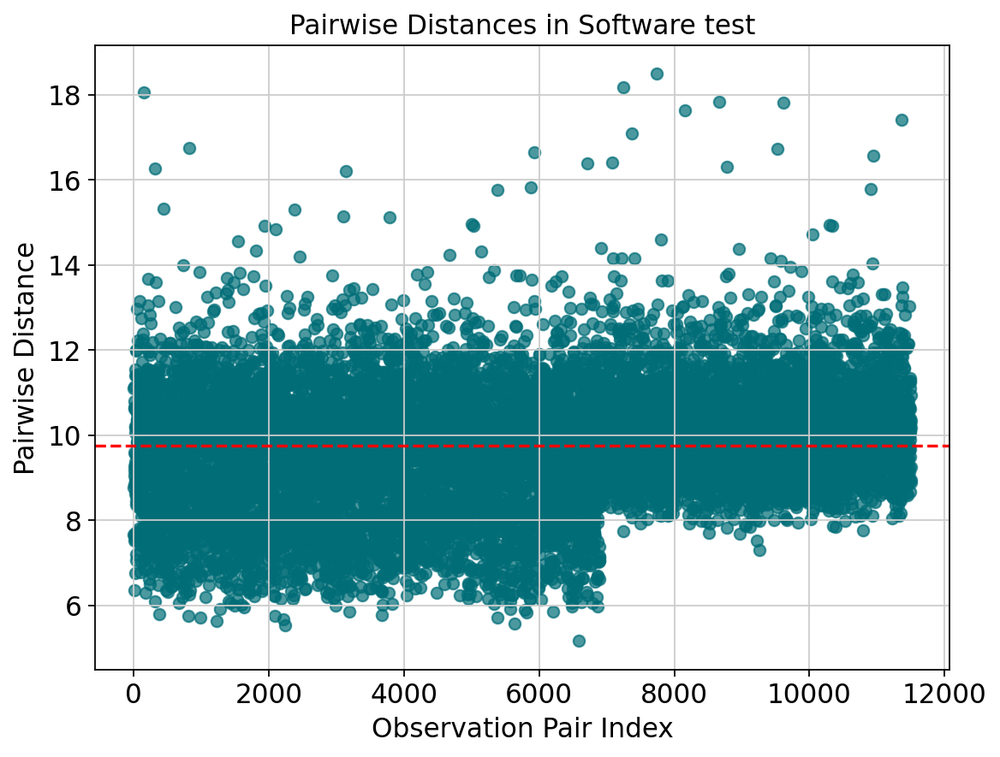

In [14]:
plt.figure(figsize=(8, 6))
plt.scatter(range(len(distances)), distances, color='#006d77', alpha=0.7)
plt.axhline(median_distance, color='red', linestyle='--', label='Median')
plt.xlabel('Observation Pair Index')
plt.ylabel('Pairwise Distance')
plt.title('Pairwise Distances in Software test')
plt.savefig('/home/hers_basak/jjiang/jack/outputs/deliverables/6_analysis/starsolo_distance.png')
plt.show()

# Concatenating 

## Siletti only

In [26]:
adata_merge_siletti = ad.concat([adata_siletti_standard_f1_reg_processed,
adata_siletti_standard_CR_f1_reg_processed],  join="outer", fill_value=0)

adata_merge_siletti.obs_names_make_unique()

sc.tl.pca(adata_merge_siletti, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_siletti, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_siletti)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


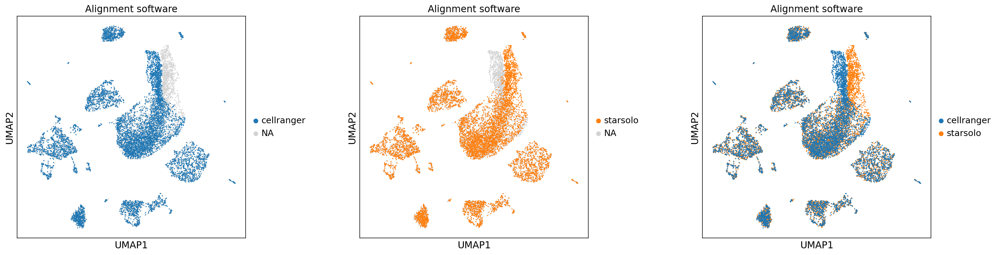

In [30]:
feature= 'software'
group1= 'cellranger'
group2= 'starsolo'

fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_siletti, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Alignment software')
sc.pl.umap(adata_merge_siletti, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Alignment software')
sc.pl.umap(adata_merge_siletti, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_siletti_subplots.png',bbox_inches='tight')

In [15]:
adata_merge_siletti = ad.concat([adata_siletti_standard_f1_processed,
adata_siletti_standard_CR_f1_processed],  join="outer", fill_value=0)

adata_merge_siletti.obs_names_make_unique()

sc.tl.pca(adata_merge_siletti, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_siletti, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_siletti)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


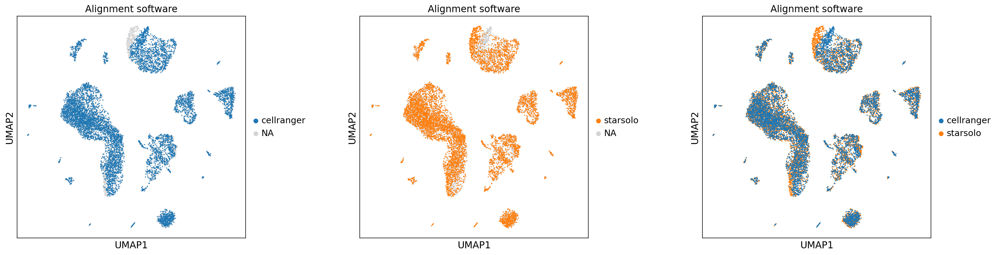

In [16]:
feature= 'software'
group1= 'cellranger'
group2= 'starsolo'

fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_siletti, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Alignment software')
sc.pl.umap(adata_merge_siletti, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Alignment software')
sc.pl.umap(adata_merge_siletti, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_siletti_no_reg_subplots.png',bbox_inches='tight')

## altena

In [17]:
adata_merge_altena = ad.concat([adata_altena_standard_f1_processed,
adata_altena_standard_CR_f1_processed],  join="outer", fill_value=0)

adata_merge_altena.obs_names_make_unique()

sc.tl.pca(adata_merge_altena, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_altena, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_altena)


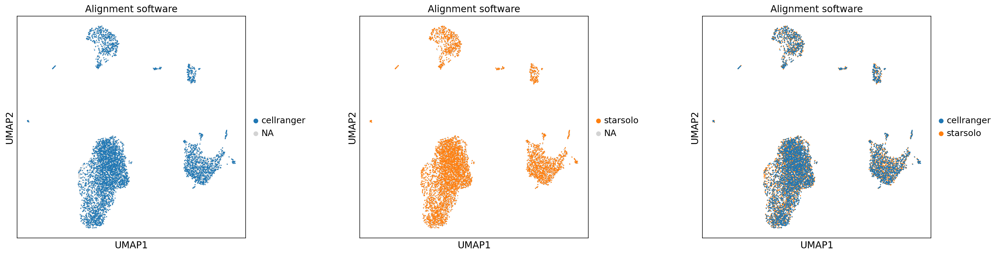

In [18]:
feature= 'software'
group1= 'cellranger'
group2= 'starsolo'

fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_altena, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Alignment software')
sc.pl.umap(adata_merge_altena, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Alignment software')
sc.pl.umap(adata_merge_altena, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_altena_subplots.png',bbox_inches='tight')

In [31]:
adata_merge_altena = ad.concat([adata_altena_standard_f1_reg_processed,
adata_altena_standard_CR_f1_reg_processed],  join="outer", fill_value=0)

adata_merge_altena.obs_names_make_unique()

sc.tl.pca(adata_merge_altena, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(adata_merge_altena, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(adata_merge_altena)


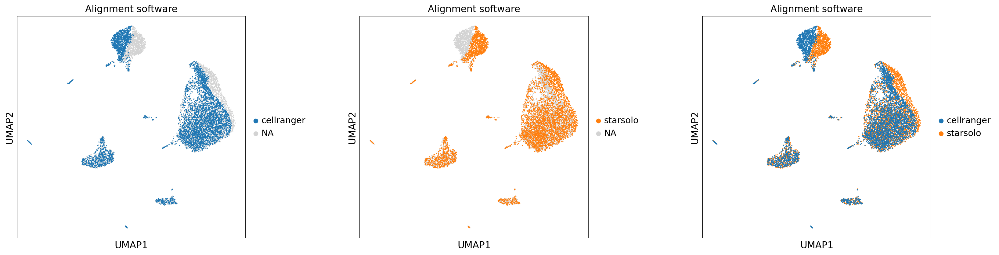

In [32]:
feature= 'software'
group1= 'cellranger'
group2= 'starsolo'

fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(adata_merge_altena, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title='Alignment software')
sc.pl.umap(adata_merge_altena, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title='Alignment software')
sc.pl.umap(adata_merge_altena, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_altena_subplots.png',bbox_inches='tight')

## All data

In [19]:
adata_merge = ad.concat([adata_siletti_standard_f1_processed, adata_siletti_standard_CR_f1_processed ,adata_altena_standard_f1_processed, adata_altena_standard_CR_f1_processed],  join="outer", fill_value=0, index_unique="_")
#adata_merge.obs_names_make_unique()

pca again

In [20]:
sc.tl.pca(adata_merge, svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

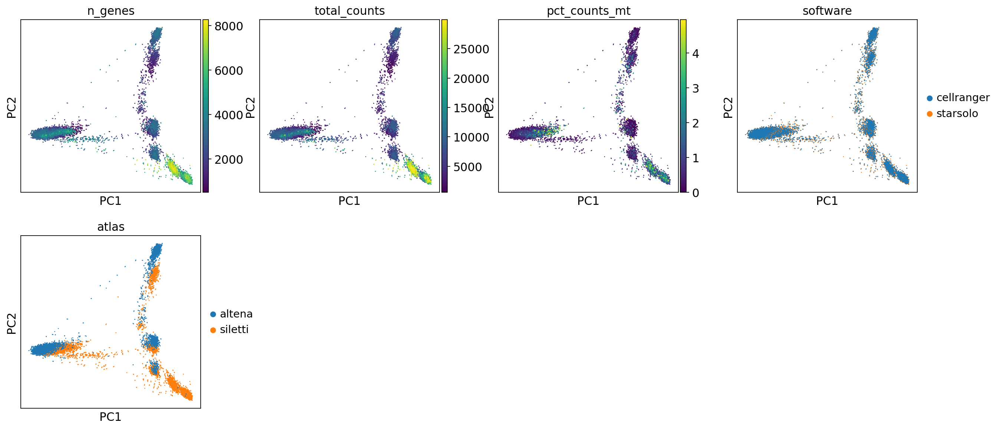

In [21]:
sc.pl.pca(adata_merge, color=['n_genes', 'total_counts', 'pct_counts_mt', 'software', 'atlas'])


In [22]:
nn= 15 #default 15
sc.pp.neighbors(adata_merge, n_neighbors=nn, n_pcs=40)
sc.tl.umap(adata_merge)

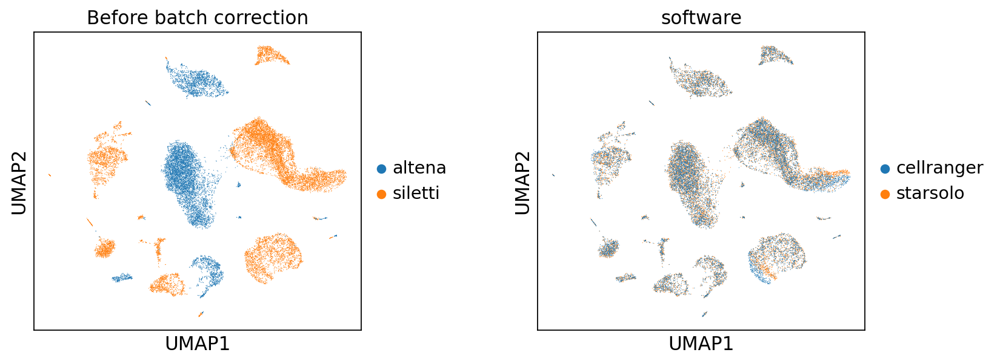

In [23]:
sc.pl.umap(adata_merge,color=[ 'atlas', 'software'], wspace=0.4,s=1, title='Before batch correction')

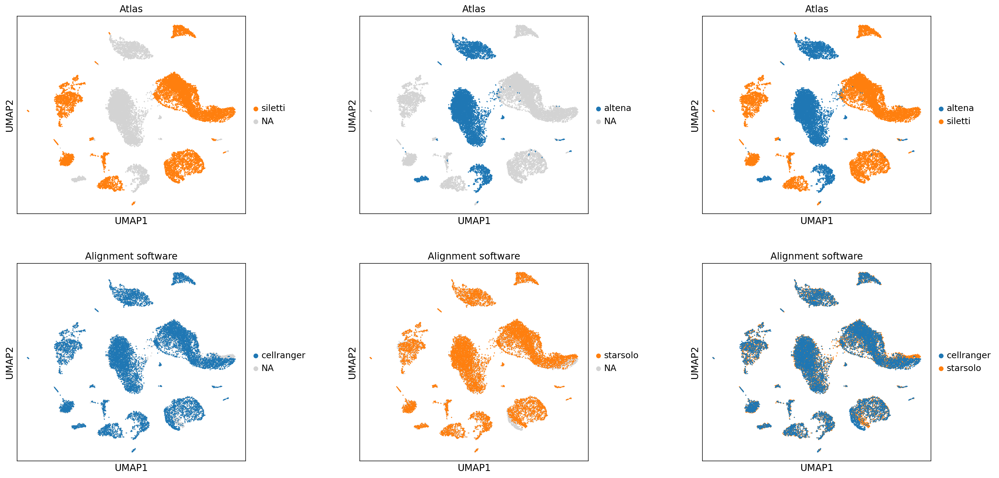

In [24]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
s = 10
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge, color='atlas', groups= 'siletti', use_raw=False, s=s, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', groups= 'altena', use_raw=False, s=s, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', use_raw=False, s=s, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='software', groups= 'cellranger', use_raw=False, s=s, ax= axs[1,0],show=False, title='Alignment software')
sc.pl.umap(adata_merge, color='software', groups= 'starsolo', use_raw=False, s=s, ax= axs[1,1],show=False, title='Alignment software')
sc.pl.umap(adata_merge, color='software', use_raw=False, s=s, ax= axs[1,2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_all_subplots.png',bbox_inches='tight')

In [25]:
adata_merge

AnnData object with n_obs × n_vars = 23211 × 35412
    obs: 'n_counts', 'species', 'sample_group', 'atlas', 'reference', 'software', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm'
    uns: 'pca', 'software_colors', 'atlas_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

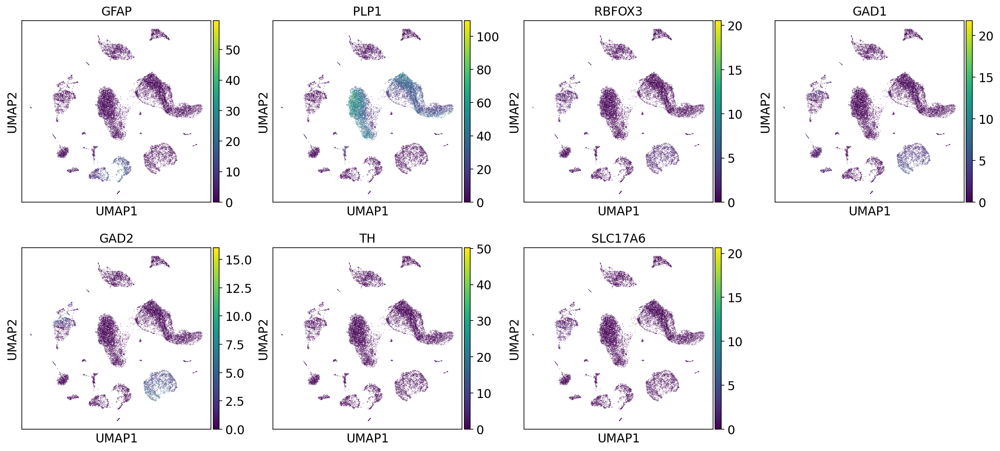

In [26]:

    if adata_merge.obs['species'][0] == 'Homo sapien':
        sc.pl.umap(adata_merge, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=1)
           #,save = "merge_umap_n"+str(nn)+"_2.pdf")
    else:
        sc.pl.umap(adata_merge, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [27]:
adata_merge_rb = adata_merge.copy()
sc.tl.pca(adata_merge_rb, svd_solver='arpack')

In [ ]:
adata_merge_rb2 = adata_merge.copy()
sc.tl.pca(adata_merge_rb2, svd_solver='arpack')

In [28]:
sc.external.pp.harmony_integrate(adata_merge_rb, key ='atlas')

2023-07-01 20:31:31,563 - harmonypy - INFO - Iteration 1 of 10
2023-07-01 20:31:37,510 - harmonypy - INFO - Iteration 2 of 10
2023-07-01 20:31:41,315 - harmonypy - INFO - Iteration 3 of 10
2023-07-01 20:31:46,144 - harmonypy - INFO - Iteration 4 of 10
2023-07-01 20:31:48,816 - harmonypy - INFO - Iteration 5 of 10
2023-07-01 20:31:50,962 - harmonypy - INFO - Iteration 6 of 10
2023-07-01 20:31:53,099 - harmonypy - INFO - Iteration 7 of 10
2023-07-01 20:31:55,247 - harmonypy - INFO - Converged after 7 iterations


In [ ]:
sc.external.pp.harmony_integrate(adata_merge_rb2, key =['atlas','software'])

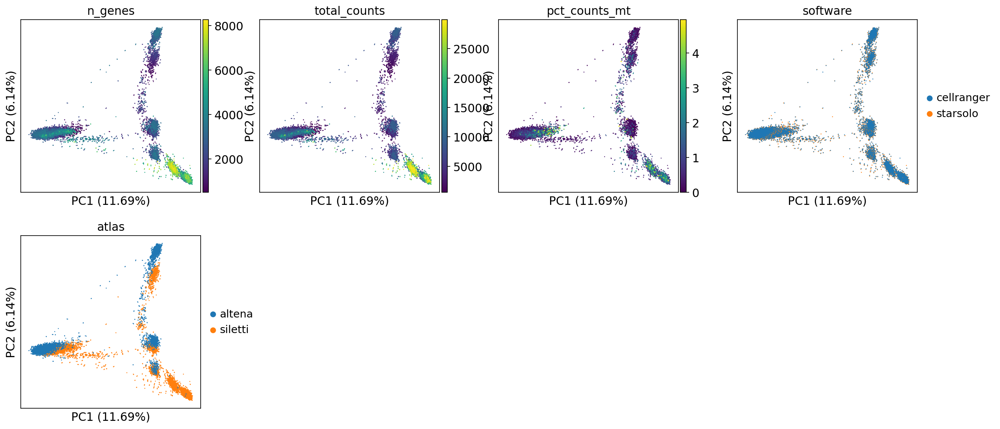

In [29]:
sc.pl.pca(adata_merge_rb, color=['n_genes', 'total_counts', 'pct_counts_mt', 'software', 'atlas'],annotate_var_explained=True)
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


In [ ]:
pca_coords = adata_merge_rb.obsm['X_pca_harmony']
software=adata_merge_rb.obs['software']

# Plot the first two principal components
for i in range(40):
    sns.scatterplot(x=pca_coords[:, 0], y=pca_coords[:, i],s=3,hue=software)
    
    plt.xlabel('PC1')
    plt.ylabel(f'PC{i}')
    plt.title('Principal Components')
    plt.show()

In [157]:
pc_values=adata_merge_rb.varm['PCs']
n_top_contributors = 10
pc_index=31
pc_loadings = [abs(i[pc_index+1]) for i in pc_values]
top_contributors_indices = np.argsort(pc_loadings)[-10:]
top_contributors = adata_merge_rb.var_names[top_contributors_indices]
print('PC: '+str(pc_index))
print(top_contributors)

PC: 31
Index(['AC120193.1', 'SHOC1', 'PLCB2', 'CD84', 'AC079793.1', 'MNDA', 'FAM177B',
       'APOE', 'C1QC', 'C1QB'],
      dtype='object')


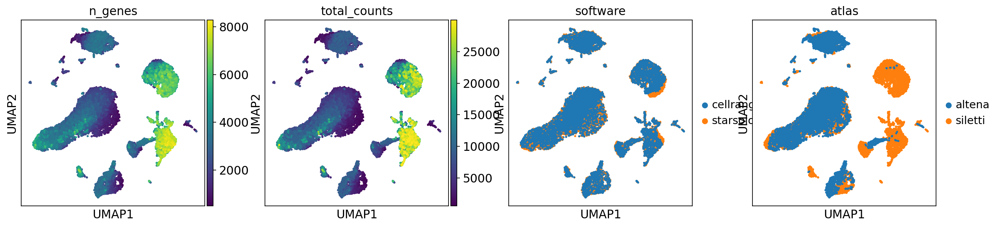

In [30]:
sc.pp.neighbors(adata_merge_rb, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_rb)
sc.pl.umap(adata_merge_rb, color=['n_genes', 'total_counts','software', 'atlas'], 
           use_raw=False, s=25,save = '_merge_batch_rb_1.pdf')

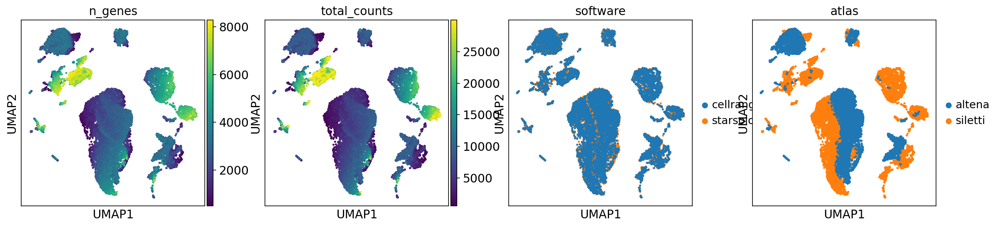

In [165]:
sc.pp.neighbors(adata_merge_rb2, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_rb2)
sc.pl.umap(adata_merge_rb2, color=['n_genes', 'total_counts','software', 'atlas'], 
           use_raw=False, s=25,save = '_merge_batch_rb2_1.pdf')

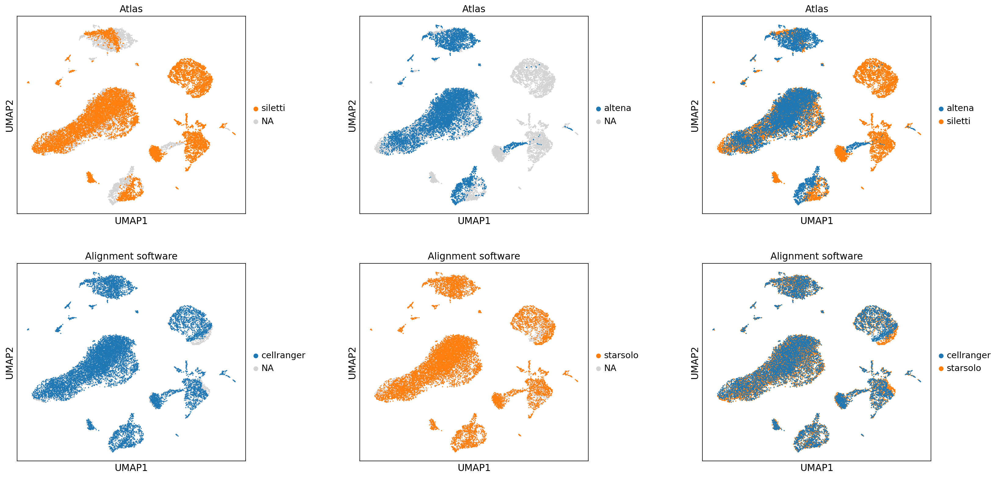

In [31]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='software', groups= 'cellranger', use_raw=False, s=10, ax= axs[1,0],show=False, title='Alignment software')
sc.pl.umap(adata_merge_rb, color='software', groups= 'starsolo', use_raw=False, s=10, ax= axs[1,1],show=False, title='Alignment software')
sc.pl.umap(adata_merge_rb, color='software', use_raw=False, s=10, ax= axs[1,2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_batch_rb_subplots.png',bbox_inches='tight')

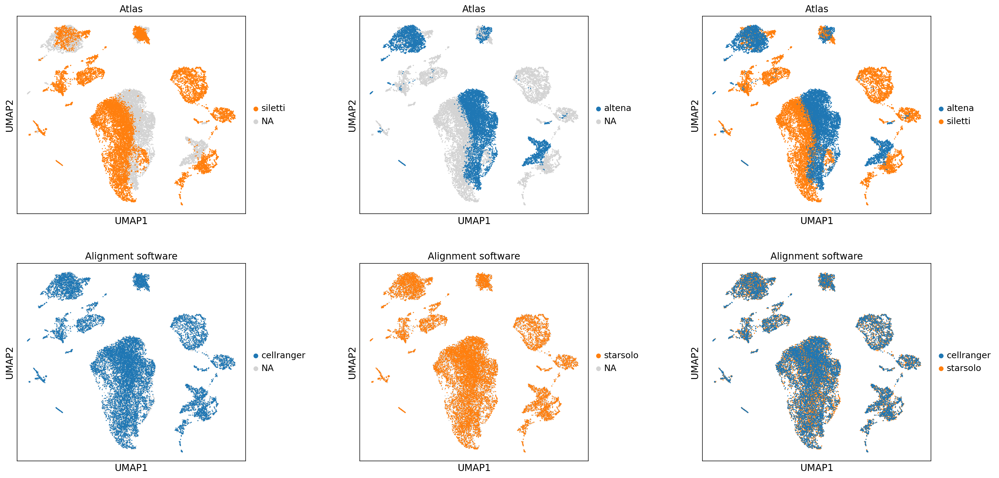

In [166]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge_rb2, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb2, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb2, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb2, color='software', groups= 'cellranger', use_raw=False, s=10, ax= axs[1,0],show=False, title='Alignment software')
sc.pl.umap(adata_merge_rb2, color='software', groups= 'starsolo', use_raw=False, s=10, ax= axs[1,1],show=False, title='Alignment software')
sc.pl.umap(adata_merge_rb2, color='software', use_raw=False, s=10, ax= axs[1,2],show=False, title='Alignment software')
fig.savefig('figures/merge/merge_batch_rb2_subplots.png',bbox_inches='tight')

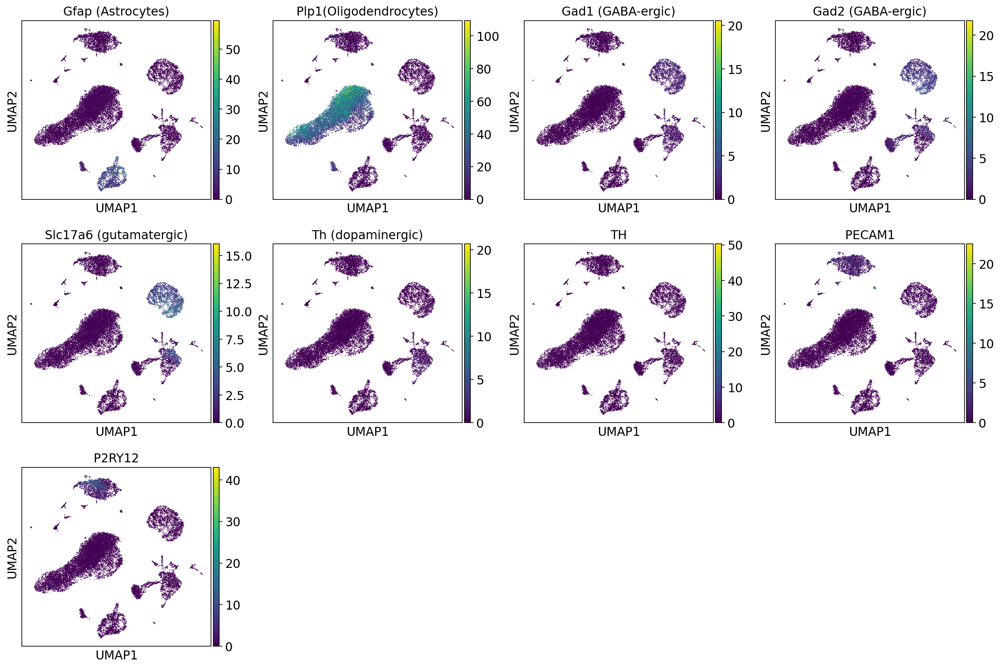

In [32]:
sc.pl.umap(adata_merge_rb, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','PECAM1','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'],  s=3)
   #save = "_merge_umap_n"+str(nn)+"_2.pdf")

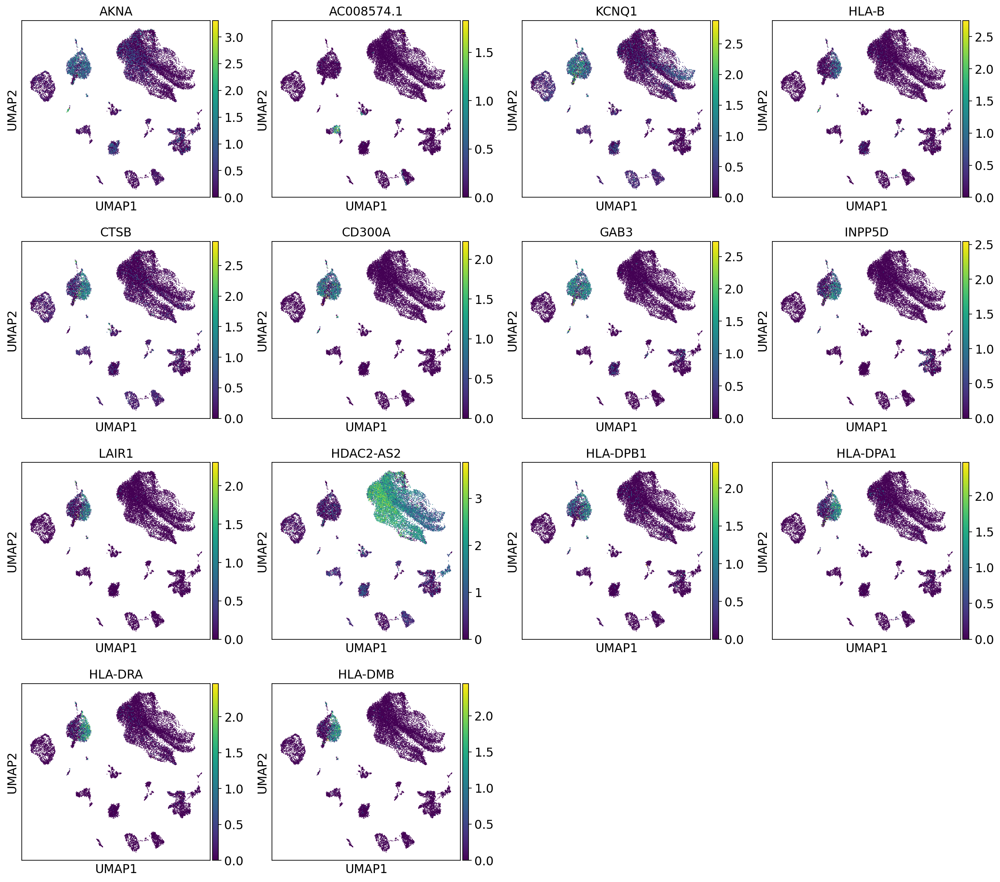

In [60]:
features =['AKNA', 'AC008574.1', 'KCNQ1', 'HLA-B', 'CTSB', 'CD300A', 'GAB3', 'INPP5D', 'LAIR1', 'HDAC2-AS2', 'HLA-DPB1', 'HLA-DPA1', 'HLA-DRA', 'HLA-DMB']
sc.pl.umap(adata_merge_rb, color=features,  s=3)
   #save = "_merge_umap_n"+str(nn)+"_2.pdf")

In [33]:
atlas_ref = adata_merge_rb.obs['atlas'].astype(str)+ "_" + adata_merge_rb.obs['software'].astype(str)
adata_merge_rb.obs['atlas_soft'] = atlas_ref

In [170]:
atlas_ref = adata_merge_rb2.obs['atlas'].astype(str)+ "_" + adata_merge_rb2.obs['software'].astype(str)
adata_merge_rb2.obs['atlas_soft'] = atlas_ref

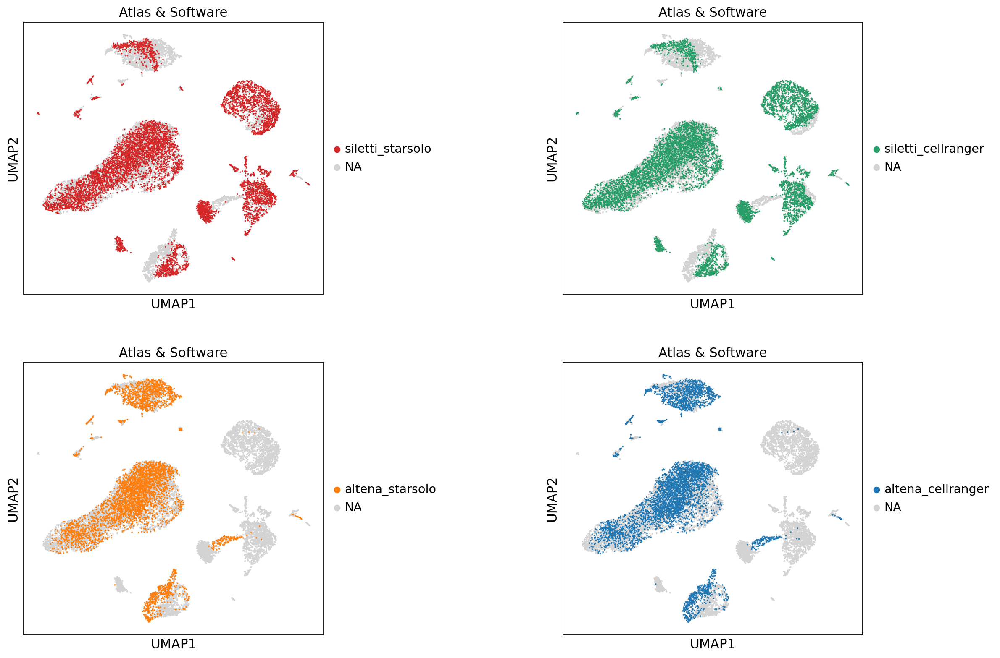

In [35]:
fig, axs = plt.subplots(2, 2, figsize = [16,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.8, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas_soft', groups= 'siletti_starsolo', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas & Software')
sc.pl.umap(adata_merge_rb, color='atlas_soft', groups= 'siletti_cellranger', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas & Software')
sc.pl.umap(adata_merge_rb, color='atlas_soft', groups= 'altena_starsolo', use_raw=False, s=10, ax= axs[1,0],show=False, title='Atlas & Software')
sc.pl.umap(adata_merge_rb, color='atlas_soft', groups= 'altena_cellranger', use_raw=False, s=10, ax= axs[1,1],show=False, title='Atlas & Software')
#sc.pl.umap(adata_merge_rb, color='atlas_ref', use_raw=False, s=25, ax= axs[0,2],show=False)
fig.savefig('figures/merge/merge_batch_rb_specific_subplots.png',bbox_inches='tight')